In [3]:
import torch
from PIL import Image
from transformers import AutoProcessor, AutoModelForCausalLM 
import requests

2025-06-27 13:25:16.099826: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751030716.325474      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751030716.380544      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [15]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("hadiepratamatulili/anime-vs-cartoon-vs-human")

print("Path to dataset files:", path)

Mounting files to /kaggle/input/anime-vs-cartoon-vs-human...
Path to dataset files: /kaggle/input/anime-vs-cartoon-vs-human


In [4]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"

model_id = 'microsoft/Florence-2-large'
model = AutoModelForCausalLM.from_pretrained(model_id, trust_remote_code=True, torch_dtype='auto').eval()
processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

config.json: 0.00B [00:00, ?B/s]

configuration_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


pytorch_model.bin:   0%|          | 0.00/1.56G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

In [5]:
model = model.to(device)

In [6]:
from PIL import Image
import requests
import torch

def generate_caption(path: str, prompt='<DETAILED_CAPTION>', num_beams=3):
    if 'http' in path:
        image = Image.open(requests.get(path, stream=True).raw).convert('RGB')
    else:
        image = Image.open(path).convert('RGB')

    inputs = processor(text=prompt, images=image, return_tensors="pt")

    # Переносим на device, приводим pixel_values к нужному dtype
    for key in inputs:
        if torch.is_tensor(inputs[key]):
            if 'pixel_values' in key:
                inputs[key] = inputs[key].to(device, dtype=next(model.parameters()).dtype)
            else:
                inputs[key] = inputs[key].to(device)

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=300,
        num_beams=num_beams,
        do_sample=False
    )

    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    return generated_text, image

## Мультики

</s><s>The image shows three people sitting on chairs in front of a wooden wall. On the left side of the image there is a table, and in the background there are stairs. The image is from the anime series Naruto Shippuden Ultimate Ninja Storm Revolution.</s>


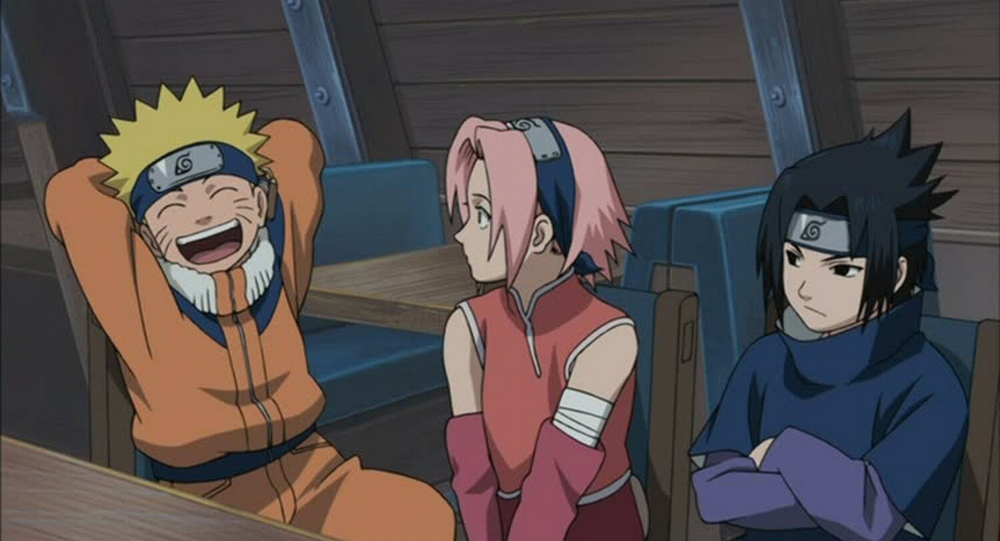

In [29]:
answer = generate_caption("https://images.kinorium.com/movie/shot/357941/w1500_51984999.jpg")

print(answer[0])
answer[1]

</s><s>The image shows a pinky and the brain logo with two cartoon mice standing in front of it. The logo is in the center of the image and the text "pinky & the brain" is written above it.</s>


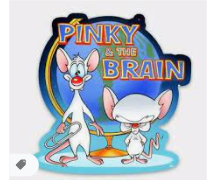

In [30]:
answer = generate_caption("/kaggle/input/anime-vs-cartoon-vs-human/Data/cartoon/0 (25).png")

print(answer[0])
answer[1]

## Шум, однородность

</s><s>The image shows a black and white photo of a person in a wheelchair at night, with the grass visible at the bottom.</s>


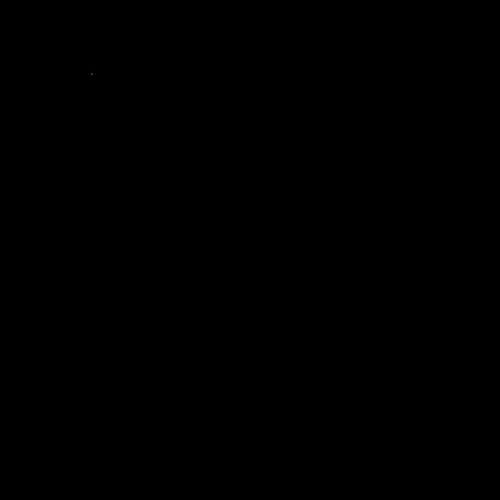

In [52]:
answer = generate_caption("https://play-lh.googleusercontent.com/cWUJV2L6u9aApAZKNkjG9_WKM8smvRguK-O2NpwLmBF2hzJ-imADntWefaWLw08sfMg=w7680-h4320")

print(answer[0])
answer[1].resize((500, 500))

</s><s>The image shows a blurry view of a field with trees in the foreground and a sky in the background. The trees are slightly blurred, giving the image a dreamy, ethereal feel.</s>


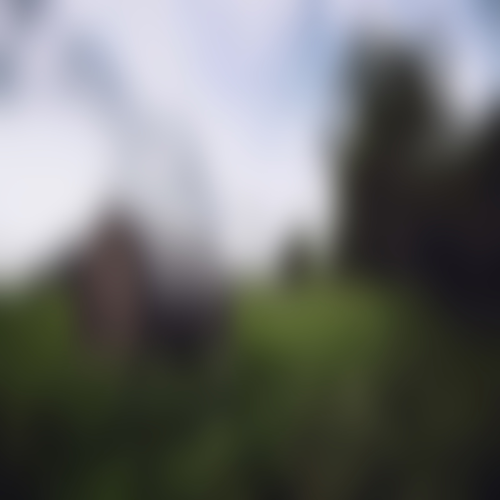

In [51]:
answer = generate_caption("https://jooinn.com/images/blur-background-11.jpg")

print(answer[0])
answer[1].resize((500, 500))

</s><s>The image shows a city skyline at night with tall buildings in the foreground and trees and light poles in the background. The sky is illuminated by the aurora borealis, creating a beautiful and serene atmosphere.</s>


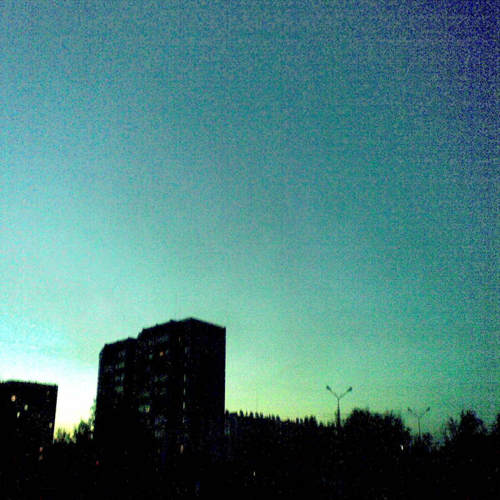

In [50]:
answer = generate_caption("https://steamuserimages-a.akamaihd.net/ugc/1764820290850853208/700C947BC7F03657147E3F0525A2C6B78EE74250/?imw=512&amp;imh=384&amp;ima=fit&amp;impolicy=Letterbox&amp;imcolor=%23000000&amp;letterbox=true")

print(answer[0])
answer[1].resize((500, 500))

</s><s>The image shows a black and white photo of a city street with a lot of squares, creating a pixelated effect. The squares are arranged in a pattern, giving the image a unique and interesting look.</s>


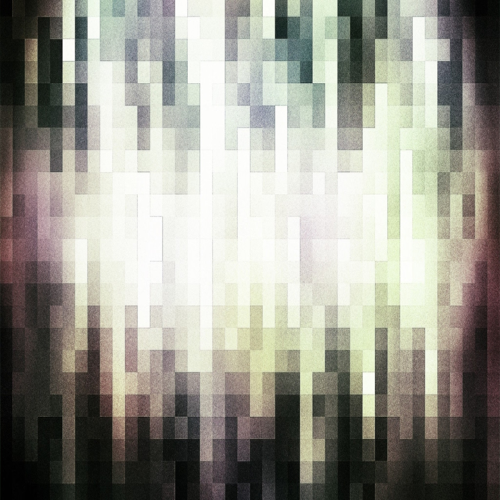

In [49]:
answer = generate_caption("https://i.ytimg.com/vi/p5is4Wc-In4/maxresdefault.jpg")

print(answer[0])
answer[1].resize((500, 500))

## Темнота

</s><s>The image shows a beautiful sunset through the trees in the woods, with the sky painted in a stunning array of oranges, pinks, and purples. The trees are silhouetted against the sky, creating a peaceful and serene atmosphere.</s>


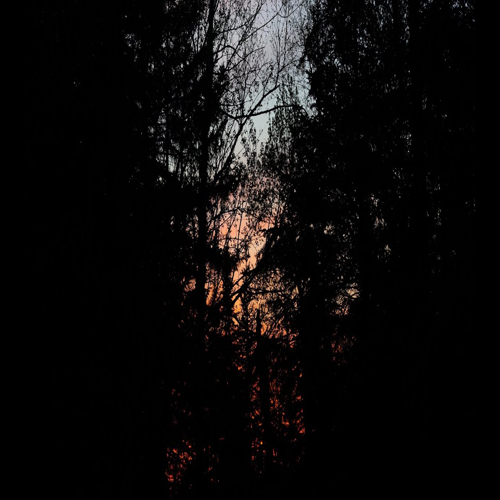

In [48]:
answer = generate_caption("https://i.ytimg.com/vi/c9kIeHUSBdM/maxresdefault.jpg")

print(answer[0])
answer[1].resize((500, 500))

</s><s>The image shows a black and white photo of a field under a cloudy sky. The ground is covered in grass and the sky is filled with dark, ominous clouds.</s>


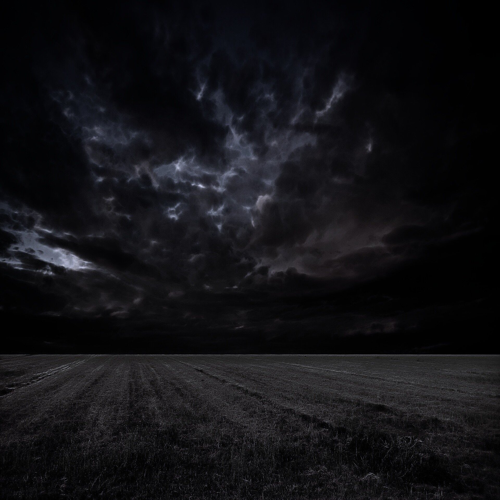

In [47]:
answer = generate_caption("https://priroda.club/uploads/posts/2023-08/1691877679_priroda-club-p-pole-les-noch-pinterest-53.jpg")

print(answer[0])
answer[1].resize((500, 500))

</s><s>The image shows a dark forest at night, with the trees silhouetted against the dark sky. The trees are illuminated by the moonlight, creating a mysterious and eerie atmosphere.</s>


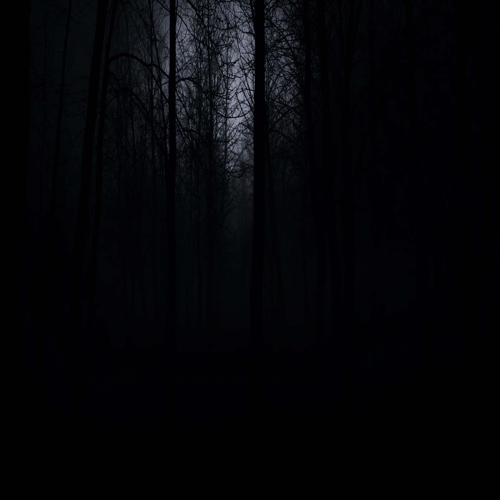

In [46]:
answer = generate_caption("https://wallpapers.com/images/hd/dark-theme-background-rw0q60hwzr3iusvf.jpg")

print(answer[0])
answer[1].resize((500, 500))

## Мемы

</s><s>The image shows a black and white drawing of a face with a smiley face, set against a white background.</s>


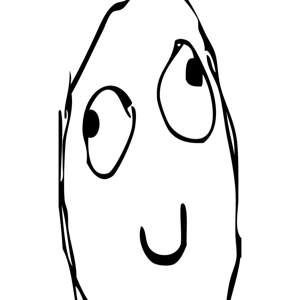

In [45]:
answer = generate_caption("https://i.ytimg.com/vi/aaVhKN4pB3M/maxresdefault.jpg")

print(answer[0])
answer[1].resize((300, 300))

</s><s><s>The image shows a drawing of a person with a rage face on a white background. The person has a wide, toothy grin and a mischievous expression, with their eyes wide open and their mouth slightly open, as if they are about to say something. The drawing is in black and white, giving it a classic, timeless look.</s>


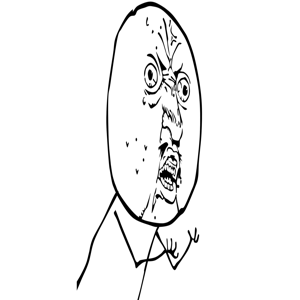

In [44]:
answer = generate_caption("https://cs14.pikabu.ru/post_img/big/2021/06/04/9/1622816576184720232.png")

print(answer[0])
answer[1].resize((300, 300))

</s><s>The image shows a black and white drawing of a rage face with an angry expression, set against a white background.</s>


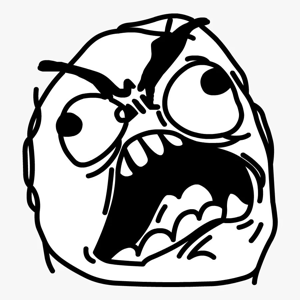

In [43]:
answer = generate_caption("https://avatars.mds.yandex.net/i?id=900134c1314ebb28c2f232bb7ad72dc5_l-9870747-images-thumbs&n=13")

print(answer[0])
answer[1].resize((300, 300))

</s><s>The image shows a black and white drawing of a man wearing a top hat and sunglasses, holding a glass of wine.</s>


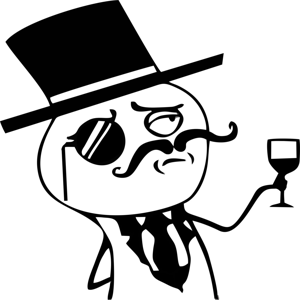

In [42]:
answer = generate_caption("https://i.etsystatic.com/11689374/r/il/21998a/875679186/il_1588xN.875679186_db6k.jpg")

print(answer[0])
answer[1].resize((300, 300))

## Интерфейсы

Дополнительно посмотрим на работу модели с интерфейсами на примере браузера: страницы ютуба, поисковиков google, yandex

</s><s>The image shows a computer screen with a variety of icons, text, numbers, and icons at the top. In the center of the screen is an aerial view of a road winding through a forest, with trees and rocks visible in the background.</s>


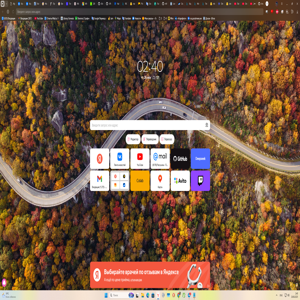

In [6]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/2025-06-26 024023.png")

print(answer[0])
answer[1].resize((300, 300))

</s><s>The image is a screenshot of a computer screen with a beautiful landscape of a winding road in the middle of a forest. The road is surrounded by trees with vibrant autumn colors, indicating that the photo was taken during the fall season. The trees are in various shades of orange, yellow, and red, creating a stunning contrast with the green foliage. The sky is a deep blue, and the sun is shining brightly, casting a warm glow over the scene.

At the top of the screen, there is a clock that reads "02:40" in Russian, indicating the time of the day. Below the clock, there are several icons representing different social media platforms such as Facebook, Twitter, Instagram, and YouTube. The icons are arranged in a grid-like pattern, with each icon representing a different app or feature. The overall mood of the image is peaceful and serene, showcasing the beauty of nature.</s>


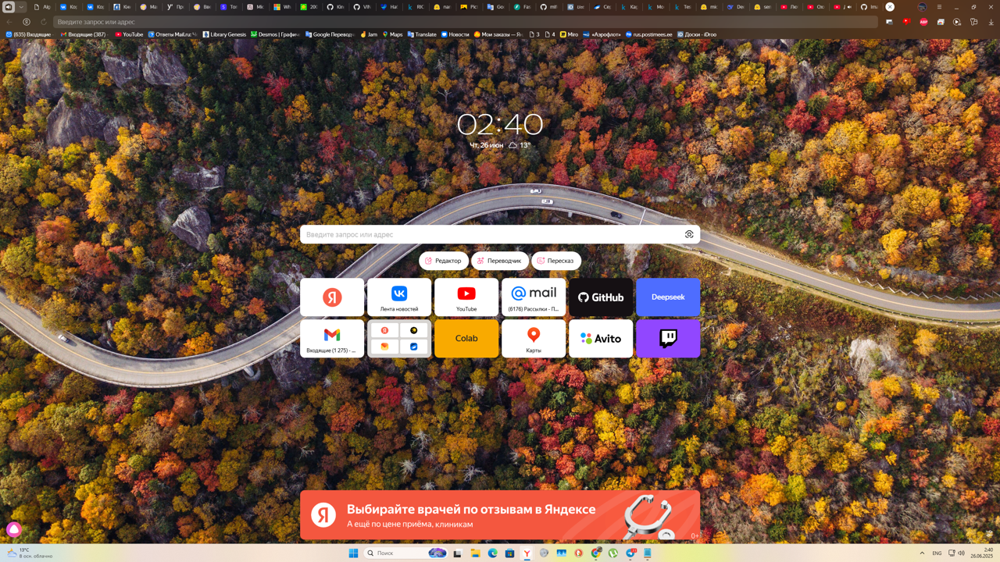

In [13]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/2025-06-26 024023.png", prompt='<MORE_DETAILED_CAPTION>')

print(answer[0])
answer[1].resize((1280, 720))

</s><s>The image is a screenshot of a computer screen with a photo of a man sitting on a rock by a river. The man is wearing a plaid shirt, khaki pants, and a baseball cap. He has a beard and is holding a fishing rod in his hands. The river is surrounded by tall grass and trees, and the sky is blue with white clouds. On the left side of the image, there is a menu bar with various options such as File, Edit, View, Tools, and Help.</s>


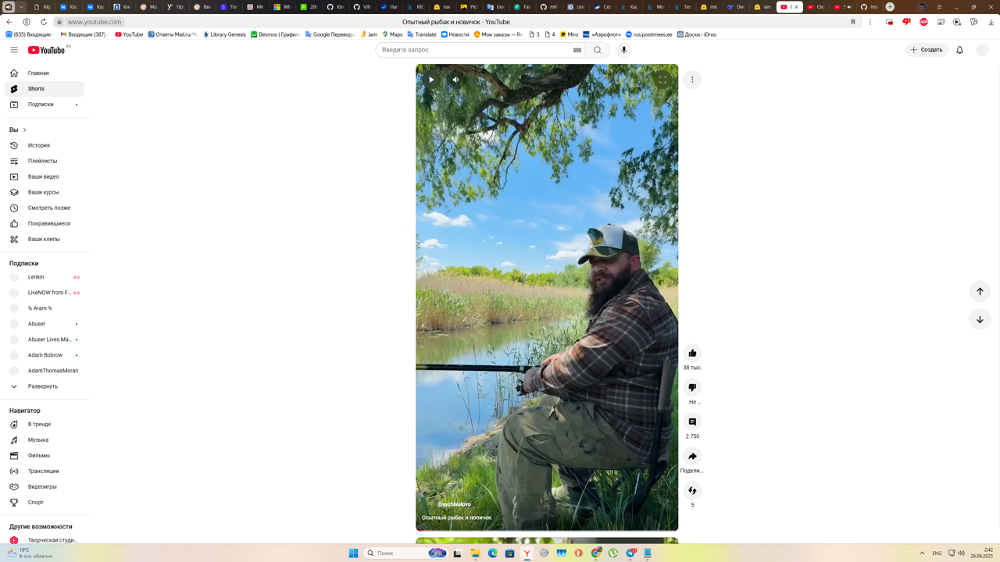

In [14]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/2025-06-26 024214.png", prompt='<MORE_DETAILED_CAPTION>')

print(answer[0])
answer[1].resize((1280, 720))

</s><s>The image is a screenshot of a computer screen with a photo of a man sitting on a bench by a lake. The man is wearing a plaid shirt, khaki pants, and a baseball cap. He has a beard and is holding a fishing rod in his hands. The lake is surrounded by trees and bushes, and the sky is blue with white clouds. The photo appears to be taken during the day. On the left side of the screen, there is a menu bar with various options such as File, Edit, View, Tools, and Help.</s>


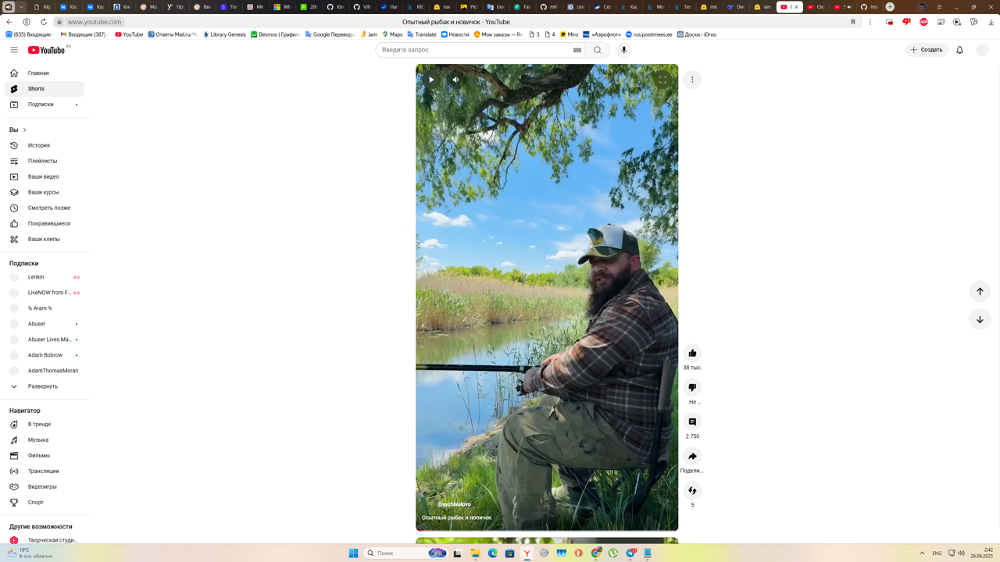

In [20]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/2025-06-26 024214.png", prompt='<MORE_DETAILED_CAPTION>', num_beams=1)

print(answer[0])
answer[1].resize((1280, 720))

</s><s>The image is a screenshot of the Google logo. The logo is in the center of the image and is written in a bold, sans-serif font. The colors of the logo are blue, red, and green. Below the logo, there is a white bar with a search bar at the bottom. On the right side of the bar, there are three icons - a phone, a camera, and a microphone. The background is plain white.</s>


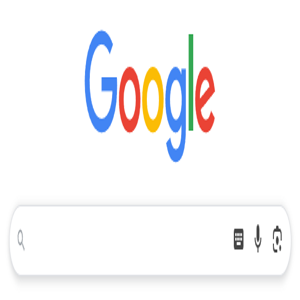

In [40]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/Google crop.png", prompt='<MORE_DETAILED_CAPTION>', num_beams=6)

print(answer[0])
answer[1].resize((300, 300))

</s><s><s><s>The image is a screenshot of a webpage on a computer screen. The webpage appears to be a website or a website with a white background and black text. At the top of the page, there is a search bar and a menu bar with various options such as File, Edit, View, Tools, and Help. Below the search bar, there are three images of a laptop, a phone, and a tablet. 

The first image on the top left corner is a red circle with a black and white image of a computer monitor. The second image is of a yellow box with a red and white striped pattern. The third image is an orange and black box with the text "Курска для драждения прохождительный растрация рограмманица пороправитиль обессилиного от перединиковить польющита о черновенные оханки о парадичи</s>


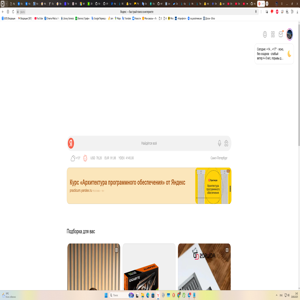

In [42]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/2025-06-26 024239.png", prompt='<MORE_DETAILED_CAPTION>', num_beams=1)

print(answer[0])
answer[1].resize((300, 300))

</s><s>The image shows the logos of various social media platforms, including Instagram, Facebook, YouTube, and Yahoo, with accompanying text.</s>


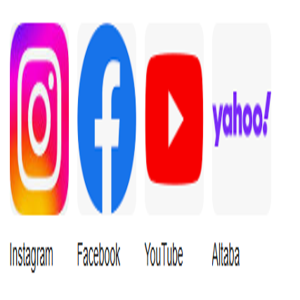

In [55]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/2025-06-26 031037.png", prompt='<DETAILED_CAPTION>', num_beams=5)

print(answer[0])
answer[1].resize((300, 300))

</s><s>The image shows four different logos of different social media platforms - Instagram, Facebook, YouTube, and Altaba. 

The first logo on the left is the Instagram logo, which is a square with a pink and orange gradient background. It has a white circle in the center with the letter "f" in the middle. The second logo is a blue circle with the Facebook logo in the top left corner. The third logo is the YouTube logo in red and white, with a play button in the bottom right corner.

Next to each logo, there is a text that reads "Yahoo!" in purple letters. The text below the logos reads "Instagram", "Facebook", "YouTube", and "Altaba".</s>


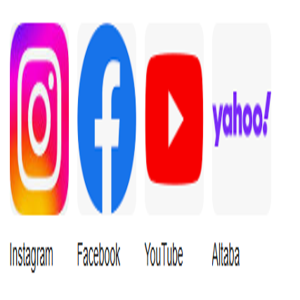

In [60]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/2025-06-26 031037.png", prompt='<MORE_DETAILED_CAPTION>', num_beams=3)

print(answer[0])
answer[1].resize((300, 300))

</s><s><s><s>The image shows four different social media logos - Instagram, Facebook, YouTube, and Altaba - arranged in a row. On the left side of the image, there is an Instagram logo in pink and orange colors, representing the social media platform. Next to it, there are two Facebook logos - Facebook and YouTube. The Facebook logo is in blue and white, while the YouTube logo is red and white. The YouTube logo has a play button in the center, indicating that it is a video player. The Altabaa logo is on the right side, representing Yahoo! logo. The image also has the text "Instagram" written in black below the logos.</s>


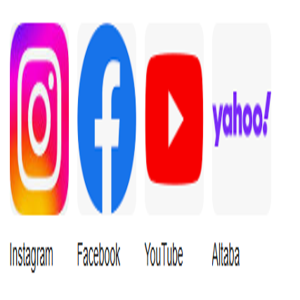

In [59]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/2025-06-26 031037.png", prompt='<MORE_DETAILED_CAPTION>', num_beams=1)

print(answer[0])
answer[1].resize((300, 300))

</s><s>The image shows a set of six icons arranged in a row on a white background. Each icon is a different color and has a unique design. 

The first icon on the left is a yellow square with a black triangle in the center. The triangle has a red dot in the middle and a black arrow pointing to the right. The second icon is in the shape of a triangle with the letter "A" in the top left corner. The third icon is of a red circle with a white arrow pointing towards the center, and the fourth icon is from the top right corner.

Next to each icon, there is a text in Russian that reads "Картиния" which translates to "Видео" in English. Below the text, there are two lines of text in both Russian and English, which translate to "Russian".

On the right side of the image, there appears to be a blue square with an orange triangle and a yellow star in the bottom right corner, which could be a logo or icon for a website or app.</s>


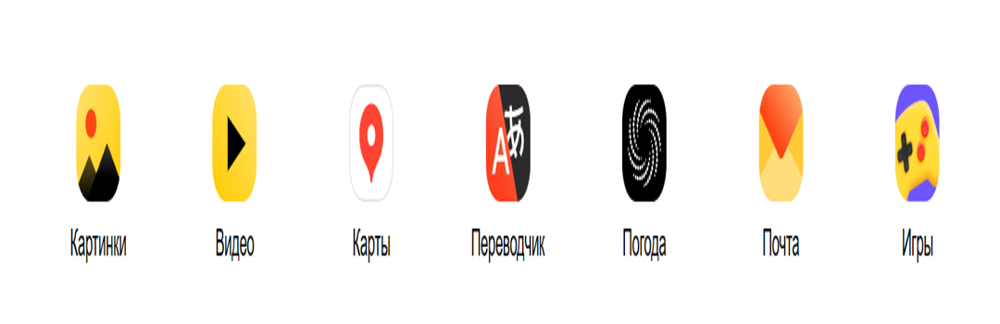

In [89]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/2025-06-26 031002.png", prompt='<MORE_DETAILED_CAPTION>', num_beams=6)

print(answer[0])
answer[1].resize((1080, 350))

</s><s><s><s>The image is a logo or icon for a company or organization. It is a square-shaped logo with a red and black color scheme. In the center of the logo, there is a white letter "A" in the shape of a triangle with a Chinese character on it. The letter "B" is written in a traditional Chinese font and is slightly larger than the rest of the text. Below the letter "Перевеводилик" which translates to "перребочацик", which is a Russian language. The logo appears to be a combination of a letter "a" and a symbol of a bicycle. The background of the image is white.</s>


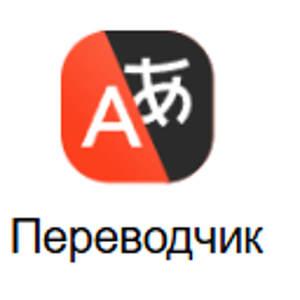

In [92]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/yandex translator icon with text.png", prompt='<MORE_DETAILED_CAPTION>', num_beams=1)

print(answer[0])
answer[1].resize((300, 300))

</s><s>The image is a logo or icon with a black and red color scheme. In the center of the logo, there is a white letter "A" in the shape of a triangle, which is the letter "a". On the right side of the triangle, there are two Chinese characters, one in white and one in black, which appear to be a symbol of balance or harmony. The background is black, and the overall design is simple and minimalistic.</s>


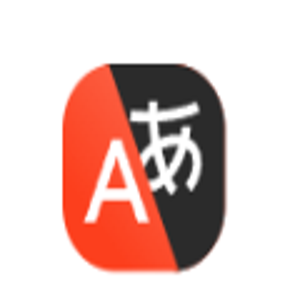

In [86]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/only yandex translator icon.png", prompt='<MORE_DETAILED_CAPTION>', num_beams=1)

print(answer[0])
answer[1].resize((300, 300))

# Выводы

**Из предложенных сценариев модель явно не смогла определить, что изображение является слишком зашумлённым (заблюренным) или однородным и выдавала ответы, не соответсвующие действительности.
При промпте DETAILED_CAPTION модель вполне хорошо справилась с мемами/рисунками, мультипликационными изображениями,тёмными изображениями.**  

**В случае комплексных интерфейсов модель также хорошо справляется с описанием общего изображения, но присутствуют галлюциниации в контексте описания конкретных элементов интерфейса (приложений или элементов управления). При наличии русского текста на изображении модель выдаёт некорректный перевод, поэтому требуется использование дополнительной модели OCR для корректного описания текста на изображении**

## Тест модели на похожих картинках с текстом на английском и без

</s><s>The image shows four young children, two boys and two girls, standing close together and smiling at the camera. They appear to be happy and excited. The background is white and there is a text overlay that reads "Change the future for those who struggle with Autism Spectrum Disorders." The children are of different ethnicities and are of African descent. The boy on the left is wearing a blue t-shirt, the boy in the middle has dark hair, and the girl on the right has blonde hair. All four children have big smiles on their faces.</s>


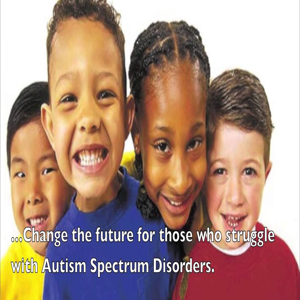

In [16]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/Children chatiry.jpg", prompt='<MORE_DETAILED_CAPTION>', num_beams=1)

print(answer[0])
answer[1].resize((300, 300))

</s><s>The image shows a group of children smiling, with the words "Change the Future for Those Who Struggle with Autism Spectrum Disorders" written across the bottom. The children appear to be of different ages and genders, suggesting that the image is meant to represent the hope and optimism that comes with struggling with autism spectrum disorders.</s>


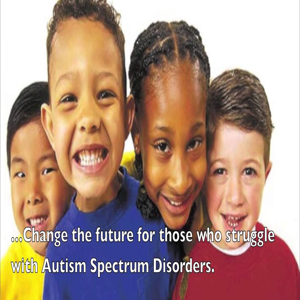

In [27]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/Children chatiry.jpg", prompt='<DETAILED_CAPTION>', num_beams=1)

print(answer[0])
answer[1].resize((300, 300))

</s><s>The image shows a group of five young people standing together with their arms crossed. They are all dressed in formal business attire, with the woman on the left wearing a black blazer and smiling at the camera. The man in the center is wearing a gray suit and tie, the woman to his left is wearing an orange blazer, and the man to his right is a man wearing a blue shirt and tie. All of them are looking at the viewer with serious expressions on their faces. The background is plain white.</s>


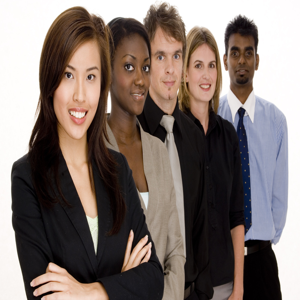

In [7]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/Office people dif races.jpg", prompt='<MORE_DETAILED_CAPTION>', num_beams=1)

print(answer[0])
answer[1].resize((300, 300))

</s><s><s><s>The image shows a group of seven young people standing on a street in a city. They are standing in a line, facing a statue of a man sitting on a bench in the center of the image. The statue is of a statue with a beard and is located on a pedestal in front of a fountain. In the background, there are several tall buildings and a construction site with scaffolding on the top. The sky is blue and the weather appears to be sunny and clear. The people in the image are of different ages and genders, and they are all looking at the statue with interest. Some of them are carrying bags, suggesting that they are on their way to a destination.</s>


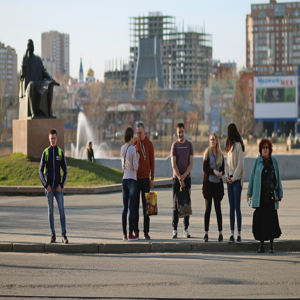

In [26]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/People in city.jpg", prompt='<MORE_DETAILED_CAPTION>', num_beams=1)

print(answer[0])
answer[1].resize((300, 300))

</s><s>The image shows a group of people standing in front of a statue on a pedestal surrounded by grass, a water fountain, trees, buildings, and a clear blue sky. Some of the people are carrying handbags and sneakers.</s>


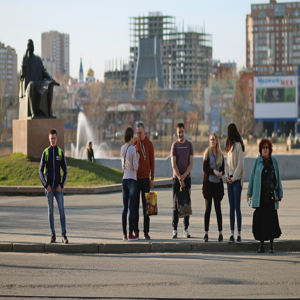

In [25]:
answer = generate_caption("/kaggle/input/interface-testing-florence-2-large/People in city.jpg", prompt='<DETAILED_CAPTION>', num_beams=1)

print(answer[0])
answer[1].resize((300, 300))

Вывод: модель хорошо справилась с прочтением текста на английском. При промпте "MORE_DETAILED_CAPTION" модель может путать порядок людей на фото и их пол. При промпте "DETAILED_CAPTION" модель хорошо обобщает содержание изображения. В совокупности с моделью, определяющей количество, пол и возраст людей, должно получиться довольно точное описание изображений с людьми.  

# Эвристики для устранения слабых мест использования модели Florence 2 large

## Однородные изображения

Мы можем отслеживать одноцветные изображения, на которых ничего не изображено, с помощью дисперсии пикселей 

In [2]:
import numpy as np

def homogenity_or_noise_filter(image, std_min = 5, std_max = 200):
    np_image = np.array(image)
    std = np.std(np_image)

    if std < std_min:
        return False, "Изображение слишком однородное", std
    if std > std_max:
        return False, "Изображение, вероятно, шумное", std
    return True, "Изображение подходит для описания", std


(False, 'Изображение слишком однородное', 0.336)


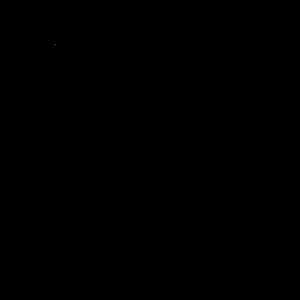

In [4]:
path = "https://play-lh.googleusercontent.com/cWUJV2L6u9aApAZKNkjG9_WKM8smvRguK-O2NpwLmBF2hzJ-imADntWefaWLw08sfMg=w7680-h4320"
image = Image.open(requests.get(path, stream=True).raw).convert('RGB')

print(homogenity_or_noise_filter(image))
image.resize((300,300))

(False, 'Изображение слишком однородное', 3.4732898437258326)


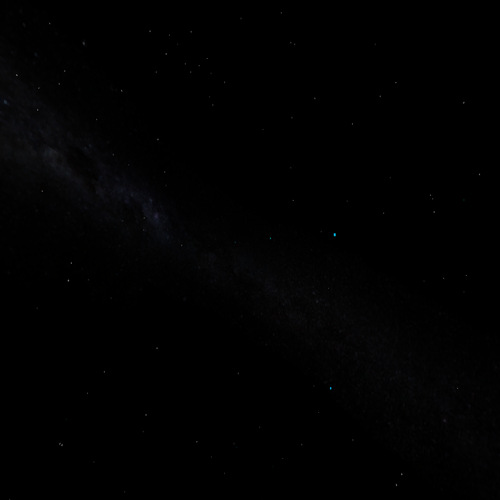

In [18]:
path = "https://avatars.dzeninfra.ru/get-zen_doc/3502163/pub_635f12ac4c69fd2a5f1c94d1_63635a32218d250c58bd7742/scale_1200"
image = Image.open(requests.get(path, stream=True).raw).convert('RGB')

print(homogenity_or_noise_filter(image))
image.resize((500,500))

(True, 'Изображение подходит для описания', 70.054)


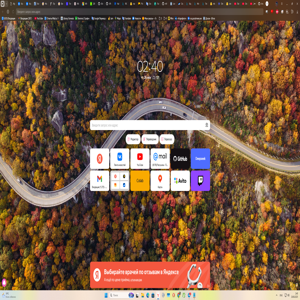

In [5]:
path = "/kaggle/input/interface-testing-florence-2-large/2025-06-26 024023.png"
image = Image.open(path).convert('RGB')

print(homogenity_or_noise_filter(image))
image.resize((300,300))

Очевидно данный фильтр при достаточно маленьком среднеквадратическом отклонении будет хорошо отсесивать однородные изображения.  
Однако, его работоспособность для шумных изображений неочевидна. Посмотрим на качество данного классификатора на сгенерированном датасете разного рода шумов.

In [6]:
import os
import numpy as np
from PIL import Image
from tqdm import tqdm

def homogenity_or_noise_filter(image, std_min=5, std_max=200):
    np_image = np.array(image)
    std = np.std(np_image)

    if std < std_min:
        return False, "Изображение слишком однородное", std
    if std > std_max:
        return False, "Изображение, вероятно, шумное", std
    return True, "Изображение подходит для описания", std

# Пути к папкам
noise_dir = '/kaggle/input/noise-images/noise'
normal_dir = '/kaggle/input/val-photos'

# Считаем стандартные отклонения для всех изображений
def calculate_stds(image_paths):
    stds = []
    for path in tqdm(image_paths):
        image = Image.open(path).convert('RGB')
        np_image = np.array(image)
        std = np.std(np_image)
        stds.append(std)
    return stds

# Список всех файлов
noise_images = [os.path.join(noise_dir, f) for f in os.listdir(noise_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
normal_images = [os.path.join(normal_dir, f) for f in os.listdir(normal_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Считаем дисперсии
noise_stds = calculate_stds(noise_images)
normal_stds = calculate_stds(normal_images)

# Границы для перебора
min_std = min(normal_stds + noise_stds)
max_std = max(normal_stds + noise_stds)

best_std_min = None
best_std_max = None
best_accuracy = 0

# Перебираем возможные значения
for std_min in np.arange(5, min(normal_stds), 0.1):
    for std_max in np.arange(max(normal_stds) + 0.1, max_std + 5, 1):
        correct = 0

        # Проверяем нормальные изображения (должны быть True)
        for std in normal_stds:
            if homogenity_or_noise_filter(std, std_min, std_max):
                correct += 1

        # Проверяем шумные изображения (должны быть False)
        for std in noise_stds:
            if not homogenity_or_noise_filter(std, std_min, std_max):
                correct += 1

        total = len(normal_stds) + len(noise_stds)
        accuracy = correct / total

        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_std_min = std_min
            best_std_max = std_max

print(f"\nЛучшие пороги:")
print(f"std_min = {round(best_std_min, 2)}, std_max = {round(best_std_max, 2)}")
print(f"Accuracy: {round(best_accuracy * 100, 2)} %")


100%|██████████| 832/832 [00:06<00:00, 119.27it/s]



Лучшие пороги:
std_min = 2.0, std_max = 108.98
Accuracy: 63.41 %


In [19]:
print(f'Минимальное std для нормальных изображений из рассмотренных = {min(normal_stds):.2f}')
print(f'Максимальное std для нормальных изображений из рассмотренных = {max(normal_stds):.2f}')

Минимальное std для нормальных изображений из рассмотренных = 24.95
Максимальное std для нормальных изображений из рассмотренных = 108.88


Полученный результат показывает, что точность классификации данной эвристики для шумных изображений очень мала.  
Но при этом фильтр однородности при std_min = 2 должен хорошо отсеивать однородные изображения. Даже экстремальная картинка с ночным небом имела std > 3.  

## Шумные изображения

Очевидно, для шумных изображений необходимо использовать другой подход.  
Ранее мы оценивали качество предсказания по метрике CLIP SCORE, которая вычисляет косинусную близость эмбеддингов полученного описания от Florence 2 и эмбеддинги самого изображения от модели CLIP.  
Можно предположить, что для шумных изображений данные модели будут выдавать очень различные эмбеддинги, так как имеют разную архитектуру и обучались на разных изображениях.  
То есть предположение состоит в том, что для шумных изображений распределение CLIP SCORE будет существенно отличаться в меньшую сторону

### CLIP INIT

In [20]:
pip install git+https://github.com/openai/CLIP.git

import clip


  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-92juqc72
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-92juqc72
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.1 MB/s eta 0:00:00:00:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [7]:
import torch
from PIL import Image
from tqdm import tqdm
from datasets import load_dataset
from transformers import AutoProcessor, AutoModelForCausalLM
import numpy as np
import time

2025-06-27 16:55:35.265551: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751043335.454676      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751043335.512801      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [8]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"

model_id = 'microsoft/Florence-2-large'
model = AutoModelForCausalLM.from_pretrained(model_id, trust_remote_code=True, torch_dtype='auto').eval()
processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

config.json: 0.00B [00:00, ?B/s]

configuration_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


pytorch_model.bin:   0%|          | 0.00/1.56G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py: 0.00B [00:00, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# Модель CLIP для оценки
clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)

In [9]:
def generate_caption(image):
    prompt = "<CAPTION>"
    inputs = processor(text=prompt, images=image, return_tensors="pt").to(device)

    # Если вход содержит pixel_values, приводим их к нужному типу
    if 'pixel_values' in inputs:
        inputs['pixel_values'] = inputs['pixel_values'].to(dtype=next(model.parameters()).dtype)

    with torch.no_grad():
        outputs = model.generate(
            input_ids=inputs["input_ids"],
            pixel_values=inputs["pixel_values"],
            max_new_tokens=300,
            num_beams=1,
            do_sample=False,
            early_stopping=True
        )

    caption = processor.batch_decode(outputs, skip_special_tokens=True)[0]
    return caption

### Посчитаем CLIP SCORE для шума (для однотонных изображений применялся шум разных видов)

In [ ]:
def compute_clip_scores_for_dataset(dataset_dir):
    """
    dataset_dir: путь к папке с изображениями
    Возвращает: список CLIP Scores для всех изображений
    """
    print(f"\nEvaluating CLIP Score on dataset: {dataset_dir}...")

    scores = []

    # Загружаем датасет
    dataset = load_dataset('imagefolder', data_dir=dataset_dir)
    dataset = dataset['train']

    image_column = "image" if "image" in dataset.features else "IMG"

    for example in tqdm(dataset, desc="Processing images"):
        image = example[image_column]
        if isinstance(image, str):
            image = Image.open(image).convert("RGB")
        else:
            image = image.convert("RGB")

        # Генерация описания
        generated_caption = generate_caption(image)

        # Подготовка для CLIP
        image_input = clip_preprocess(image).unsqueeze(0).to(device)
        text_input = clip.tokenize([generated_caption]).to(device)

        with torch.no_grad():
            image_features = clip_model.encode_image(image_input)
            text_features = clip_model.encode_text(text_input)

            image_features /= image_features.norm(dim=-1, keepdim=True)
            text_features /= text_features.norm(dim=-1, keepdim=True)

            similarity = (image_features @ text_features.T).item()
            scores.append(similarity)

    print(f"\nFinished computing CLIP Scores. Total images processed: {len(scores)}")
    return scores

In [45]:
noise_CLIPS = compute_clip_scores_for_dataset('/kaggle/input/noise-images/noise')


Evaluating CLIP Score on dataset: /kaggle/input/noise-images/noise...


Resolving data files:   0%|          | 0/480 [00:00<?, ?it/s]

Processing images: 100%|██████████| 480/480 [03:45<00:00,  2.13it/s]


Finished computing CLIP Scores. Total images processed: 480


In [10]:
import numpy as np
import matplotlib.pyplot as plt

def analyze_distribution(values, bins=20, title='Distribution Analysis'):
    """
    Анализирует распределение данных и выводит статистику с гистограммой.
    
    Параметры:
        values (list/np.array): список значений для анализа
        bins (int): количество интервалов для гистограммы
        title (str): заголовок графика
    """
    # Конвертируем в numpy array для вычислений
    values = np.array(values)
    
    # Вычисляем статистики
    stats = {
        'mean': np.mean(values),
        'std': np.std(values),
        'min': np.min(values),
        '25%': np.quantile(values, 0.25),
        'median': np.median(values),
        '75%': np.quantile(values, 0.75),
        'max': np.max(values)
    }
    
    # Создаем график
    plt.figure(figsize=(10, 5))
    
    # Гистограмма
    plt.hist(values, bins=bins, edgecolor='black', alpha=0.7)
    plt.title(title)
    plt.xlabel('Values')
    plt.ylabel('Frequency')
    
    # Добавляем вертикальные линии для статистик
    colors = {
        'mean': 'red',
        'std': 'purple',
        'min/max': 'blue',
        'quantiles': 'green'
    }
    
    plt.axvline(stats['mean'], color=colors['mean'], linestyle='--', label=f'Mean: {stats["mean"]:.2f}')
    plt.axvline(stats['median'], color=colors['quantiles'], linestyle=':', label=f'Median: {stats["median"]:.2f}')
    plt.axvline(stats['25%'], color=colors['quantiles'], linestyle=':', label=f'25%: {stats["25%"]:.2f}')
    plt.axvline(stats['75%'], color=colors['quantiles'], linestyle=':', label=f'75%: {stats["75%"]:.2f}')
    plt.axvline(stats['min'], color=colors['min/max'], linestyle='-.', label=f'Min: {stats["min"]:.2f}')
    plt.axvline(stats['max'], color=colors['min/max'], linestyle='-.', label=f'Max: {stats["max"]:.2f}')
    
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
    return stats

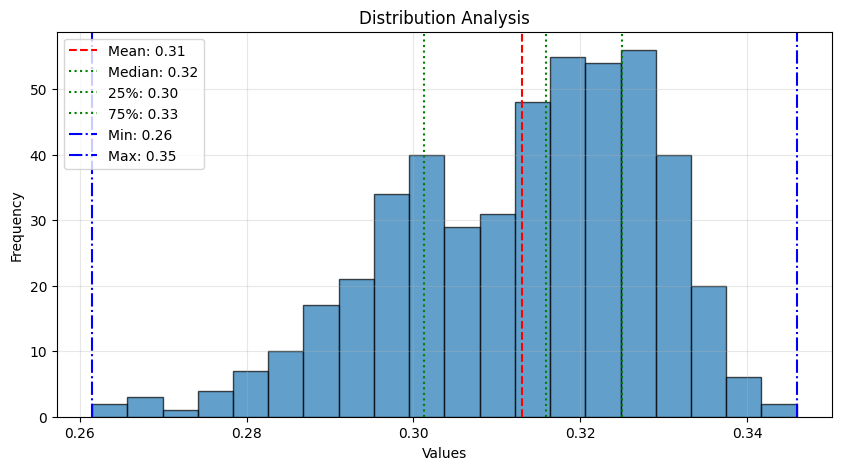

{'mean': 0.3130304972330729,
 'std': 0.015408794921181196,
 'min': 0.261474609375,
 '25%': 0.30126953125,
 'median': 0.31591796875,
 '75%': 0.32501220703125,
 'max': 0.345947265625}

In [47]:
analyze_distribution(noise_CLIPS)

Получились на удивление высокие значения метрики CLIP SCORE. Посмотрим на ответ модели FLORENCE 2 large для данных шумных изображений.

a green background with a small pattern 

a green background with a white border 

A bright blue background with a small pattern. 

a green background with small dots 

a purple background with a black border 

a green background with a small pattern 

Последняя картинка:


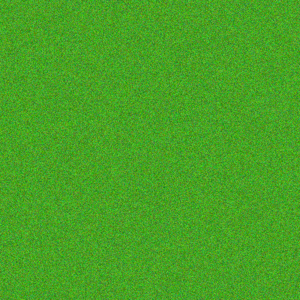

In [59]:
images = ['/kaggle/input/noise-images/noise/noise_000_gaussian.png',
          '/kaggle/input/noise-images/noise/noise_001_jpeg.png',
          '/kaggle/input/noise-images/noise/noise_002_poisson.png',
          '/kaggle/input/noise-images/noise/noise_003_salt_pepper.png',
          '/kaggle/input/noise-images/noise/noise_004_speckle.png', 
          '/kaggle/input/noise-images/noise/noise_005_uniform.png']

for cur_image in images:
    if isinstance(cur_image, str):
        cur_image = Image.open(cur_image).convert("RGB")
    else:
        cur_image = image.convert("RGB")


    print(generate_caption(cur_image), '\n')

print(f'Последняя картинка:')
cur_image.resize((300,300))

Модель правильно определила превалирующий цвет на "background", поэтому неудивительно, что данная метрика довольно высока.  
Посмотрим на распределение метрики для чистого гауссовского шума


Evaluating CLIP Score on dataset: /kaggle/input/noise-images/gaussian_noise_samples...


Resolving data files:   0%|          | 0/100 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Processing images: 100%|██████████| 100/100 [00:55<00:00,  1.82it/s]



Finished computing CLIP Scores. Total images processed: 100


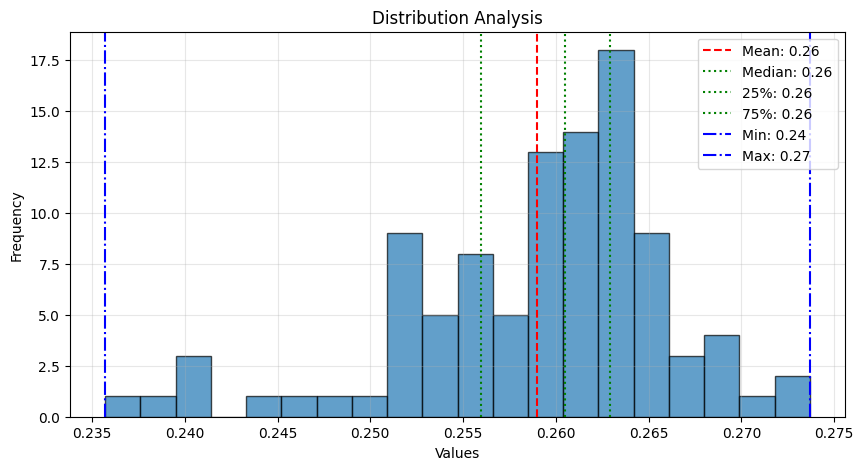

{'mean': 0.258958740234375,
 'std': 0.007106125791264353,
 'min': 0.2357177734375,
 '25%': 0.2559814453125,
 'median': 0.260498046875,
 '75%': 0.262939453125,
 'max': 0.273681640625}

In [60]:
only_gaussian_noise_CLIPS = compute_clip_scores_for_dataset('/kaggle/input/noise-images/gaussian_noise_samples')


analyze_distribution(only_gaussian_noise_CLIPS)

a black and white image of a tv screen with a lot of dots on it 

a black and white image of a tv screen with a lot of dots on it 

a black and white image of a tv screen with a lot of dots on it 

a black and white image of a square with a red dot in the middle 

a black and white image of a tv screen with a lot of dots on it 

a black and white image of a tv screen with a lot of dots on it 

Последняя картинка:


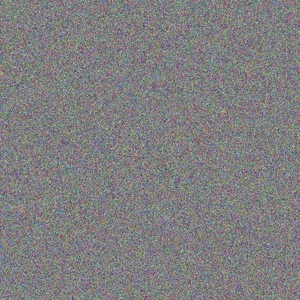

In [66]:
images = ['/kaggle/input/noise-images/gaussian_noise_samples/gaussian_noise_025.png',
          '/kaggle/input/noise-images/gaussian_noise_samples/gaussian_noise_026.png',
          '/kaggle/input/noise-images/gaussian_noise_samples/gaussian_noise_027.png',
          '/kaggle/input/noise-images/gaussian_noise_samples/gaussian_noise_028.png',
          '/kaggle/input/noise-images/gaussian_noise_samples/gaussian_noise_029.png', 
          '/kaggle/input/noise-images/gaussian_noise_samples/gaussian_noise_030.png']

for cur_image in images:
    if isinstance(cur_image, str):
        cur_image = Image.open(cur_image).convert("RGB")
    else:
        cur_image = image.convert("RGB")


    print(generate_caption(cur_image), '\n')

print(f'Последняя картинка:')
cur_image.resize((300,300))

Модель определила гауссовский шум как чёрно-белое изображение телевизора или квадрат с точками внутри, на что он действительно похож.  
Посмотрим на CLIP score на изображениях из начала блокнота:

CLIP score = 0.260
Caption: A black and white image of a wall made up of squares.


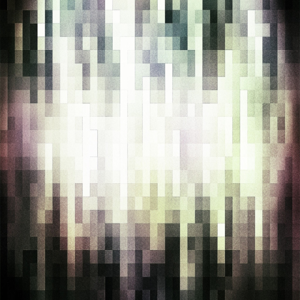

In [71]:
path = "https://i.ytimg.com/vi/p5is4Wc-In4/maxresdefault.jpg"
image = Image.open(requests.get(path, stream=True).raw).convert('RGB')

# Генерация описания
generated_caption = generate_caption(image)

# Подготовка для CLIP
image_input = clip_preprocess(image).unsqueeze(0).to(device)
text_input = clip.tokenize([generated_caption]).to(device)

with torch.no_grad():
    image_features = clip_model.encode_image(image_input)
    text_features = clip_model.encode_text(text_input)

    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    similarity = (image_features @ text_features.T).item()

print(f'CLIP score = {similarity:.3f}')
print(f'Caption: {generated_caption}')
image.resize((300,300))

CLIP score = 0.226
Caption: a black and white photo of a person in a wheelchair


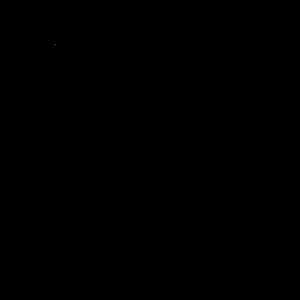

In [72]:
path = "https://play-lh.googleusercontent.com/cWUJV2L6u9aApAZKNkjG9_WKM8smvRguK-O2NpwLmBF2hzJ-imADntWefaWLw08sfMg=w7680-h4320"
image = Image.open(requests.get(path, stream=True).raw).convert('RGB')

# Генерация описания
generated_caption = generate_caption(image)

# Подготовка для CLIP
image_input = clip_preprocess(image).unsqueeze(0).to(device)
text_input = clip.tokenize([generated_caption]).to(device)

with torch.no_grad():
    image_features = clip_model.encode_image(image_input)
    text_features = clip_model.encode_text(text_input)

    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    similarity = (image_features @ text_features.T).item()

print(f'CLIP score = {similarity:.3f}')
print(f'Caption: {generated_caption}')
image.resize((300,300))

**Теперь посмотрим на распределение CLIP scores на примерах из coco датасета**

In [48]:
coco_CLIPS = compute_clip_scores_for_dataset('/kaggle/input/val-photos')


Evaluating CLIP Score on dataset: /kaggle/input/val-photos...


Resolving data files:   0%|          | 0/832 [00:00<?, ?it/s]

Processing images: 100%|██████████| 832/832 [07:08<00:00,  1.94it/s]


Finished computing CLIP Scores. Total images processed: 832


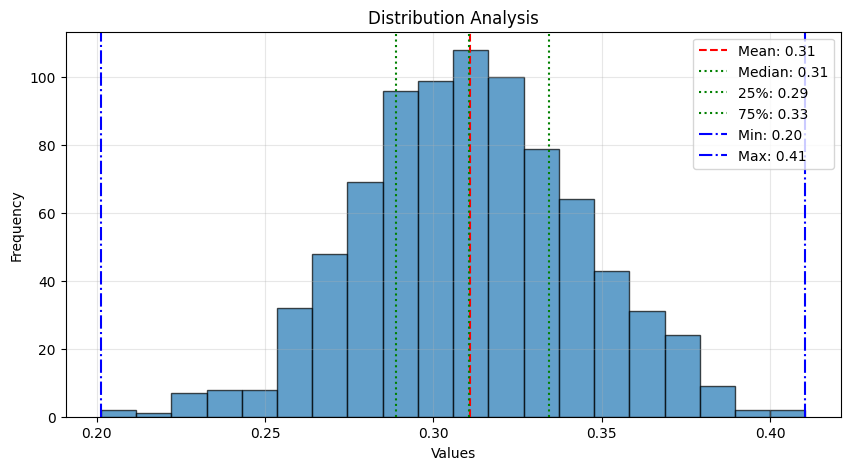

{'mean': 0.31095402057354266,
 'std': 0.03282004615043332,
 'min': 0.2012939453125,
 '25%': 0.28875732421875,
 'median': 0.3104248046875,
 '75%': 0.3343505859375,
 'max': 0.410400390625}

In [49]:
analyze_distribution(coco_CLIPS)

In [80]:
counter = 0
poses = []
for i in range(len(coco_CLIPS)):
    if coco_CLIPS[i] > 0.261:
        counter += 1
    else:
        poses.append(i)
print(f'{round((len(coco_CLIPS) - counter) / len(coco_CLIPS) * 100, 3)}% изображений из coco датасета имеют clip_score < 0.261)')
poses[:3]

5.769% изображений из coco датасета имеют clip_score < 0.261)


[8, 12, 21]

In [81]:
# Путь к датасету
dataset_dir = '/kaggle/input/val-photos'

dataset = load_dataset('imagefolder', data_dir=dataset_dir)['train']

image_column = "image" if "image" in dataset.features else "IMG"

# Получение сгенерированных описаний для выбранных изображений
captions = []

for i in tqdm(poses, desc="Generating captions for low CLIP Score images"):
    image = dataset[i][image_column]

    if isinstance(image, str):
        image = Image.open(image).convert("RGB")
    else:
        image = image.convert("RGB")

    caption = generate_caption(image)
    captions.append((i, caption))

# captions — список кортежей (индекс, сгенерированная подпись)
print("\nGenerated captions for low CLIP Score images:")
for idx, caption in captions:
    print(f"Image {idx}: {caption}")

Resolving data files:   0%|          | 0/832 [00:00<?, ?it/s]

Generating captions for low CLIP Score images: 100%|██████████| 48/48 [00:23<00:00,  2.03it/s]


Generated captions for low CLIP Score images:
Image 8: A baseball player standing on top of a baseball field.
Image 12: A group of people standing in front of a red truck.
Image 21: A laptop computer sitting on top of a wooden table.
Image 70: A green and yellow train traveling down train tracks next to a parking lot.
Image 95: A man sitting on a bench under an umbrella by the water.
Image 126: A television set sitting on top of a table next to a remote control.
Image 130: A pair of scissors sitting on top of a piece of paper.
Image 133: A group of baseball players standing on top of a field.
Image 153: A group of men playing a game of soccer.
Image 198: A traffic light with a green arrow on it.
Image 206: A stop sign sitting in the middle of a grassy field.
Image 211: A train traveling down train tracks next to a train station.
Image 253: A group of young people standing in front of a graffiti covered wall.
Image 270: A highway with a bunch of cars driving down it.
Image 275: A littl

Показываю изображение 824: 000000011525.jpg
Описание: A small airplane flying through a cloudy sky.


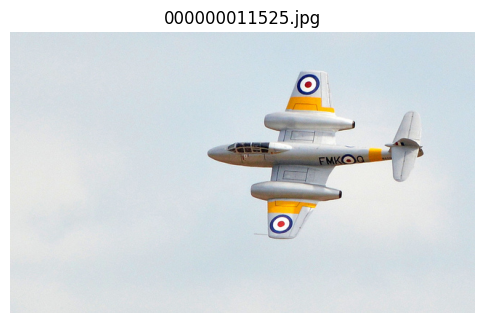

In [84]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import time
from IPython.display import display, clear_output

dataset_path = '/kaggle/input/val-photos'

all_images = sorted([f for f in os.listdir(dataset_path)])

# Функция для отображения изображения на 2 секунды
def show_image_for_10_seconds(img_path):
    img = Image.open(img_path)
    caption = generate_caption(img)

    print(f'Описание: {caption}')
    
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(os.path.basename(img_path))
    
    display(plt.gcf())
    
    time.sleep(10)
    
    clear_output(wait=True)
    plt.close()

for idx, img_name in enumerate(all_images):
    if idx in poses:
        img_path = os.path.join(dataset_path, img_name)
        print(f"Показываю изображение {idx}: {img_name}")
        show_image_for_10_seconds(img_path)

Качество описаний для изображений, CLIP score для которых оказался невысоким, довольно точное. Модель хорошо обобщённо описывает картинку, выделяя на ней главный объект. Следовательно, отсечение таким порогом может быть ложным как минимум для 5% изображений. 

### Посмотрим на распределение уверенности самой модели по каждому токену 

Средняя уверенность по всем токенам = 0.909
perplexity по всем токенам = 1.112


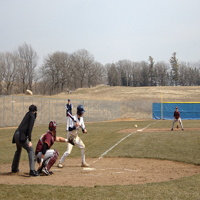

In [121]:
prompt = "<CAPTION>"
img_path = '/kaggle/input/val-photos/000000000488.jpg'
image =  Image.open(img_path).convert("RGB")

# path = "https://i.ytimg.com/vi/p5is4Wc-In4/maxresdefault.jpg"
# image = Image.open(requests.get(path, stream=True).raw).convert('RGB')

inputs = processor(text=prompt, images=image, return_tensors="pt").to(device)

if 'pixel_values' in inputs:
    inputs['pixel_values'] = inputs['pixel_values'].to(dtype=next(model.parameters()).dtype)

with torch.no_grad():
    outputs = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=300,
        num_beams=1,
        do_sample=False,
        early_stopping=True,
        output_scores=True,
        return_dict_in_generate=True
    )


logits = torch.stack(outputs.scores, dim=1) # делаем тензор из кортежа тензоров
probs = torch.softmax(logits, dim=-1) # переводим логиты в вероятности
token_probs = probs.max(dim=-1).values # берём токены с максимальной вероятностью
print(f'Средняя уверенность по всем токенам = {token_probs.mean().item():.3f}')
selected_token_logprobs = torch.log(token_probs)
perplexity = torch.exp(-selected_token_logprobs.mean()).item()

print(f'perplexity по всем токенам = {perplexity:.3f}')

image.resize((200,200))

In [122]:
caption = processor.batch_decode(outputs[0], skip_special_tokens=False)[0]
caption

'</s><s>A baseball player swinging a bat at a ball.</s>'

В каждом описании присутствуют служебные токены, которые завышают среднюю вероятность и perplexity. Уберём их из расчёта

In [123]:
import torch

logits = torch.stack(outputs.scores, dim=1)
generated_tokens = outputs.sequences  

tokens_to_use = generated_tokens[:, 1:] 

# Вероятности для реально сгенерированных токенов
probs = torch.softmax(logits, dim=-1)
selected_probs = probs.gather(-1, tokens_to_use.unsqueeze(-1)).squeeze(-1)  # (1, 12)

# Маску для не служебных токенов != 0 и != 2
mask = (tokens_to_use != 0) & (tokens_to_use != 2)  # (1, 12)

filtered_probs = selected_probs[mask]  # (n_non_special_tokens,)

print(f'Средняя уверенность по не служебным токенам = {filtered_probs.mean().item():.3f}')

# Perplexity
if len(filtered_probs) > 0:
    perplexity = torch.exp(-torch.log(filtered_probs).mean()).item()
    print(f'Перплексия (без токенов 0 и 2): {perplexity:.2f}')
else:
    print('Нет токенов для вычисления перплексии')

Средняя уверенность по не служебным токенам = 0.891
Перплексия (без токенов 0 и 2): 1.14


Значение перплексии очень низкое, что показывает высокую среднюю уверенность модели. На примере полученного описания можно заметить, что уверенность модели в служебных частях речи очень высокая, а также она уверенно выдаёт слова, напрямую характеризующие картинку: player, swinging, bat, ball, что соответствует действительности 

In [124]:
print(filtered_probs) # последняя вероятность выдаётся для точки в конце
print(caption[6:-4])

tensor([0.8053, 0.6862, 0.9204, 0.9894, 0.9994, 0.9968, 0.6578, 0.9999, 0.9938,
        0.8573], device='cuda:0')
>A baseball player swinging a bat at a ball.


In [125]:
for token, prob in zip(caption[6:-1].split(), filtered_probs[:-1]):
    print(f"{token}: {prob:.4f}")

>A: 0.8053
baseball: 0.6862
player: 0.9204
swinging: 0.9894
a: 0.9994
bat: 0.9968
at: 0.6578
a: 0.9999
ball.</s: 0.9938


Средняя уверенность по всем токенам = 0.716
perplexity по всем токенам = 1.571


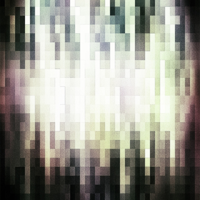

In [126]:
prompt = "<CAPTION>"

path = "https://i.ytimg.com/vi/p5is4Wc-In4/maxresdefault.jpg"
image = Image.open(requests.get(path, stream=True).raw).convert('RGB')

inputs = processor(text=prompt, images=image, return_tensors="pt").to(device)

if 'pixel_values' in inputs:
    inputs['pixel_values'] = inputs['pixel_values'].to(dtype=next(model.parameters()).dtype)

with torch.no_grad():
    outputs = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=300,
        num_beams=1,
        do_sample=False,
        early_stopping=True,
        output_scores=True,
        return_dict_in_generate=True
    )


logits = torch.stack(outputs.scores, dim=1) # делаем тензор из кортежа тензоров
probs = torch.softmax(logits, dim=-1) # переводим логиты в вероятности
token_probs = probs.max(dim=-1).values # берём токены с максимальной вероятностью
print(f'Средняя уверенность по всем токенам = {token_probs.mean().item():.3f}')
selected_token_logprobs = torch.log(token_probs)
perplexity = torch.exp(-selected_token_logprobs.mean()).item()

print(f'perplexity по всем токенам = {perplexity:.3f}')

image.resize((200,200))

In [127]:
logits = torch.stack(outputs.scores, dim=1)
generated_tokens = outputs.sequences  

tokens_to_use = generated_tokens[:, 1:] 

# Вероятности для реально сгенерированных токенов
probs = torch.softmax(logits, dim=-1)
selected_probs = probs.gather(-1, tokens_to_use.unsqueeze(-1)).squeeze(-1)  # (1, 12)

# Маску для не служебных токенов != 0 и != 2
mask = (tokens_to_use != 0) & (tokens_to_use != 2)  # (1, 12)

filtered_probs = selected_probs[mask]  # (n_non_special_tokens,)

print(f'Средняя уверенность по не служебным токенам = {filtered_probs.mean().item():.3f}')

# Perplexity
if len(filtered_probs) > 0:
    perplexity = torch.exp(-torch.log(filtered_probs).mean()).item()
    print(f'Перплексия (без токенов 0 и 2): {perplexity:.2f}')
else:
    print('Нет токенов для вычисления перплексии')

Средняя уверенность по не служебным токенам = 0.709
Перплексия (без токенов 0 и 2): 1.61


Следующее изображение, на котором наблюдались галлюцинации

Средняя уверенность по всем токенам = 0.653
perplexity по всем токенам = 2.046
</s><s>The image shows a person in a wheelchair at night, surrounded by grass. The photo is in black and white, and it is a representation of the 2018-2019 season of the popular TV show, The Simpsons.</s>


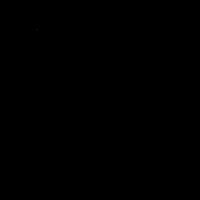

In [152]:
prompt = '<DETAILED_CAPTION>'

path = "https://play-lh.googleusercontent.com/cWUJV2L6u9aApAZKNkjG9_WKM8smvRguK-O2NpwLmBF2hzJ-imADntWefaWLw08sfMg=w7680-h4320"
image = Image.open(requests.get(path, stream=True).raw).convert('RGB')

inputs = processor(text=prompt, images=image, return_tensors="pt").to(device)

if 'pixel_values' in inputs:
    inputs['pixel_values'] = inputs['pixel_values'].to(dtype=next(model.parameters()).dtype)

with torch.no_grad():
    outputs = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=300,
        num_beams=1,
        do_sample=False,
        early_stopping=True,
        output_scores=True,
        return_dict_in_generate=True
    )


logits = torch.stack(outputs.scores, dim=1) # делаем тензор из кортежа тензоров
probs = torch.softmax(logits, dim=-1) # переводим логиты в вероятности
token_probs = probs.max(dim=-1).values # берём токены с максимальной вероятностью
print(f'Средняя уверенность по всем токенам = {token_probs.mean().item():.3f}')
selected_token_logprobs = torch.log(token_probs)
perplexity = torch.exp(-selected_token_logprobs.mean()).item()

print(f'perplexity по всем токенам = {perplexity:.3f}')

print(processor.batch_decode(outputs[0], skip_special_tokens=False)[0])
image.resize((200,200))

In [153]:
logits = torch.stack(outputs.scores, dim=1)
generated_tokens = outputs.sequences  

tokens_to_use = generated_tokens[:, 1:] 

# Вероятности для реально сгенерированных токенов
probs = torch.softmax(logits, dim=-1)
selected_probs = probs.gather(-1, tokens_to_use.unsqueeze(-1)).squeeze(-1)  # (1, 12)

# Маску для не служебных токенов != 0 и != 2
mask = (tokens_to_use != 0) & (tokens_to_use != 2) 

filtered_probs = selected_probs[mask]  # (n_non_special_tokens,)

print(f'Средняя уверенность по не служебным токенам = {filtered_probs.mean().item():.3f}')

# Perplexity
if len(filtered_probs) > 0:
    perplexity = torch.exp(-torch.log(filtered_probs).mean()).item()
    print(f'Перплексия (без токенов 0 и 2): {perplexity:.2f}')
else:
    print('Нет токенов для вычисления перплексии')

Средняя уверенность по не служебным токенам = 0.637
Перплексия (без токенов 0 и 2): 2.11


Для последнего изображения уверенность модели при промпте 'CAPTION' была около 0.88 за счёт служебных частей речи. При этом при увеличении детализированности описания средняя уверенность модели рухнула до 0.637.

Для шумного изображения значение perplexity всё ещё низкое даже без служебных токенов. При этом средняя уверенность по токенам сильно опустилась.  
**Можно предположить, что эффективно устранять нерелевантные предсказания по шумным изображениям или предупреждать пользователя о возможных ошибках можно, основываясь на пороге средней уверенности модели по не служебным токенам** 

In [11]:
from datasets import load_dataset
from tqdm import tqdm


def compute_confidence_scores_for_dataset(dataset_dir, prompt="<CAPTION>"):
    """
    dataset_dir: путь к папке с изображениями
    Возвращает: список средних уверенностей по неслужебным токенам для всех изображений
    """
    print(f"\nEvaluating Model Confidence on dataset: {dataset_dir}...")
    
    confidence_scores = []
    service_token_ids = {0, 2}  # ID для <pad> и </s>

    # Загружаем датасет
    dataset = load_dataset('imagefolder', data_dir=dataset_dir)
    dataset = dataset['train']
    
    image_column = "image" if "image" in dataset.features else "IMG"

    for example in tqdm(dataset, desc="Processing images"):
        image = example[image_column]
        if isinstance(image, str):
            image = Image.open(image).convert("RGB")
        else:
            image = image.convert("RGB")

        # Генерация описания с получением scores
        inputs = processor(text=prompt, images=image, return_tensors="pt").to(device)
        
        if 'pixel_values' in inputs:
            inputs['pixel_values'] = inputs['pixel_values'].to(dtype=next(model.parameters()).dtype)

        with torch.no_grad():
            outputs = model.generate(
                input_ids=inputs["input_ids"],
                pixel_values=inputs["pixel_values"],
                max_new_tokens=300,
                num_beams=1,
                do_sample=False,
                early_stopping=True,
                output_scores=True,
                return_dict_in_generate=True
            )

        # Обработка scores
        logits = torch.stack(outputs.scores, dim=1)  # (batch_size, seq_len, vocab_size)
        generated_tokens = outputs.sequences  # (batch_size, seq_len)
        
        # Выравнивание размерностей (удаляем первый токен)
        tokens_to_use = generated_tokens[:, 1:]
        
        # Получаем вероятности для реально сгенерированных токенов
        probs = torch.softmax(logits, dim=-1)
        selected_probs = probs.gather(-1, tokens_to_use.unsqueeze(-1)).squeeze(-1)
        
        # Маска для неслужебных токенов
        mask = (tokens_to_use != 0) & (tokens_to_use != 2)
        filtered_probs = selected_probs[mask]
        
        # Вычисляем среднюю уверенность
        if len(filtered_probs) > 0:
            mean_confidence = filtered_probs.mean().item()
            confidence_scores.append(mean_confidence)
        else:
            confidence_scores.append(0.0)  # Если нет неслужебных токенов

    print(f"\nFinished computing Confidence Scores. Total images processed: {len(confidence_scores)}")
    return confidence_scores

In [133]:
compute_confidence_scores_for_dataset('/kaggle/input/interface-testing-florence-2-large')


Evaluating Model Confidence on dataset: /kaggle/input/interface-testing-florence-2-large...


Processing images: 100%|██████████| 12/12 [00:07<00:00,  1.62it/s]


Finished computing Confidence Scores. Total images processed: 12


[0.8700186610221863,
 0.8329516649246216,
 0.8783637881278992,
 0.8717884421348572,
 0.8894689679145813,
 0.5549263954162598,
 0.8641263246536255,
 0.8075178265571594,
 0.9541776776313782,
 0.9114022254943848,
 0.6312887668609619,
 0.7016609907150269]

('</s><s>The image shows the logos of various social media platforms, including Instagram, Facebook, YouTube, and Yahoo, with the words "Yahoo" written underneath.</s>', <PIL.Image.Image image mode=RGB size=427x131 at 0x7A43DC1DD750>) 



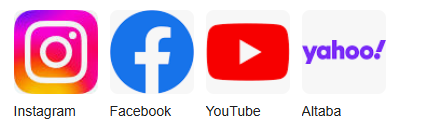

In [138]:
# Для изображения, соответствующему средней вероятности 0.5549..
print(generate_caption('/kaggle/input/interface-testing-florence-2-large/2025-06-26 031037.png'), '\n')
Image.open('/kaggle/input/interface-testing-florence-2-large/2025-06-26 031037.png')

In [140]:
# Для изображения, соответствующему средней вероятности 0.6312..
generate_caption('/kaggle/input/interface-testing-florence-2-large/only yandex translator icon.png')

('</s><s>The image shows a black and red logo with Chinese characters on it against a white background.</s>',
 <PIL.Image.Image image mode=RGB size=120x94>)

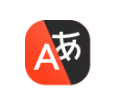

In [141]:
Image.open('/kaggle/input/interface-testing-florence-2-large/only yandex translator icon.png')

#### Проверим распределение средней вероятности по не служебным токенам на шумном датасете

In [181]:
noise_confidence_scores = compute_confidence_scores_for_dataset('/kaggle/input/noise-images/noise')


Evaluating Model Confidence on dataset: /kaggle/input/noise-images/noise...


Resolving data files:   0%|          | 0/480 [00:00<?, ?it/s]

Processing images: 100%|██████████| 480/480 [03:40<00:00,  2.18it/s]


Finished computing Confidence Scores. Total images processed: 480


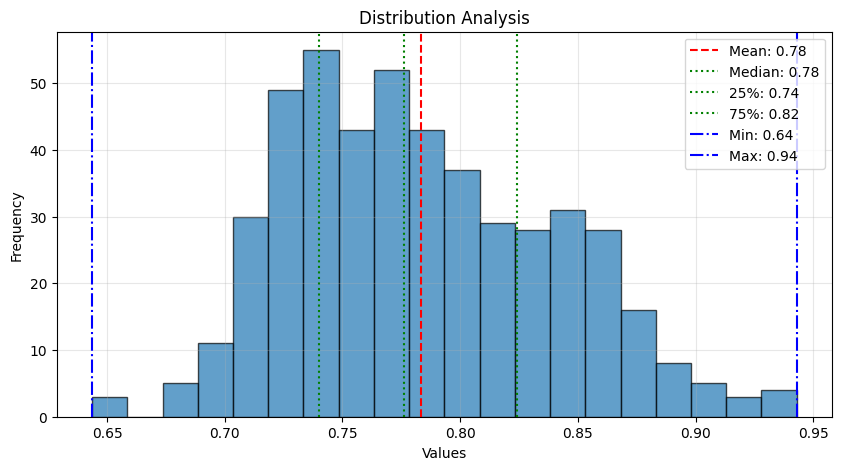

{'mean': 0.7831711854785681,
 'std': 0.05549407640510859,
 'min': 0.6436556577682495,
 '25%': 0.7400260120630264,
 'median': 0.7761552035808563,
 '75%': 0.8241198509931564,
 'max': 0.9429812431335449}

In [182]:
analyze_distribution(noise_confidence_scores)


Evaluating Model Confidence on dataset: /kaggle/input/val-photos...


Resolving data files:   0%|          | 0/832 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Processing images: 100%|██████████| 832/832 [07:13<00:00,  1.92it/s]



Finished computing Confidence Scores. Total images processed: 832


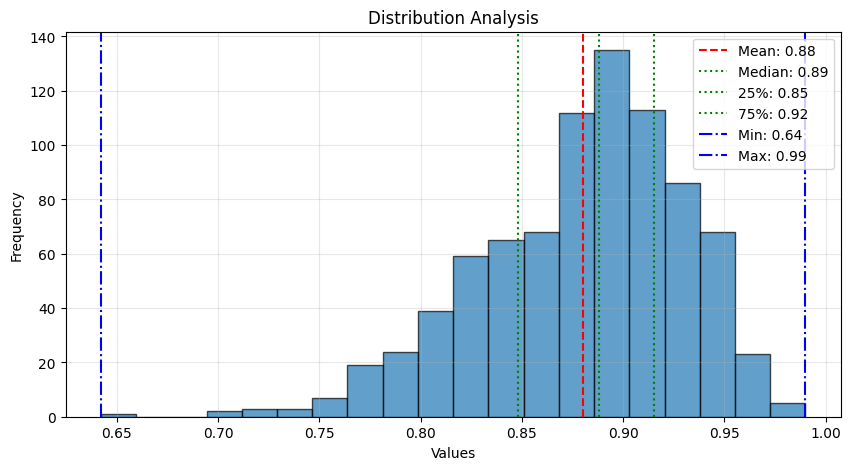

{'mean': 0.8799735434496632,
 'std': 0.05083208030555766,
 'min': 0.6421980857849121,
 '25%': 0.8479891568422318,
 'median': 0.8879132568836212,
 '75%': 0.9152211248874664,
 'max': 0.9899576902389526}

In [145]:
coco_confidence_scores = compute_confidence_scores_for_dataset('/kaggle/input/val-photos')
analyze_distribution(coco_confidence_scores)

Хорошо видно, что при промпте 'CAPTION' модель в среднем намного более уверенна в своих описаниях

In [169]:
threshold = 0.75
counter = 0
poses = []
for i in range(len(coco_confidence_scores)):
    if coco_confidence_scores[i] > threshold:
        counter += 1
    else:
        poses.append(i)
print(f'{round((len(coco_confidence_scores) - counter) / len(coco_confidence_scores) * 100, 3)}% изображений из coco датасета имеют confidence_score < {threshold}')
poses[:3]

1.202% изображений из coco датасета имеют confidence_score < 0.75


[26, 63, 209]

Показываю изображение 623: 000000008762.jpg
Описание: A traffic light on a street corner at night. 


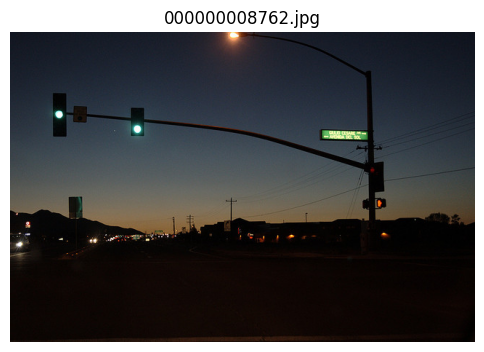

In [180]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import time
from IPython.display import display, clear_output

dataset_path = '/kaggle/input/val-photos'

all_images = sorted([f for f in os.listdir(dataset_path)])

# Функция для отображения изображения на 2 секунды
def show_uncertain_images(img_path):
    img = Image.open(img_path)
    caption = generate_caption(img)

    print(f'Описание: {caption}')
    
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(os.path.basename(img_path))
    
    display(plt.gcf())
    
    time.sleep(10)
    
    clear_output(wait=True)
    plt.close()

for idx, img_name in enumerate(all_images):
    if idx in poses:
        img_path = os.path.join(dataset_path, img_name)
        print(f"Показываю изображение {idx}: {img_name}")
        show_uncertain_images(img_path)

Для prompt = 'CAPTION' даже для изображений с низкой степенью уверенности краткие описания изображений оказываются правдоподобными. 

Посмотрим на распределение средней уверенности для более детального описания

In [4]:
noise_confidence_scores_detailed = compute_confidence_scores_for_dataset('/kaggle/input/noise-images/noise', prompt='<DETAILED_CAPTION>')


Evaluating Model Confidence on dataset: /kaggle/input/noise-images/noise...


Resolving data files:   0%|          | 0/480 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Processing images:   0%|          | 0/480 [00:00<?, ?it/s]


NameError: name 'processor' is not defined

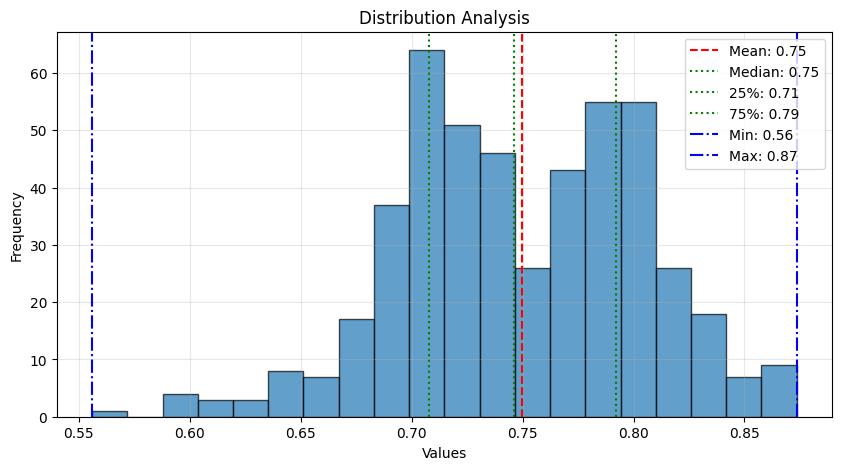

{'mean': 0.7496243504186472,
 'std': 0.054995796695307166,
 'min': 0.5560014843940735,
 '25%': 0.7079871147871017,
 'median': 0.7459546625614166,
 '75%': 0.7919217050075531,
 'max': 0.8735158443450928}

In [184]:
analyze_distribution(noise_confidence_scores_detailed)


Evaluating Model Confidence on dataset: /kaggle/input/val-photos...


Resolving data files:   0%|          | 0/832 [00:00<?, ?it/s]

Processing images: 100%|██████████| 832/832 [12:41<00:00,  1.09it/s]



Finished computing Confidence Scores. Total images processed: 832


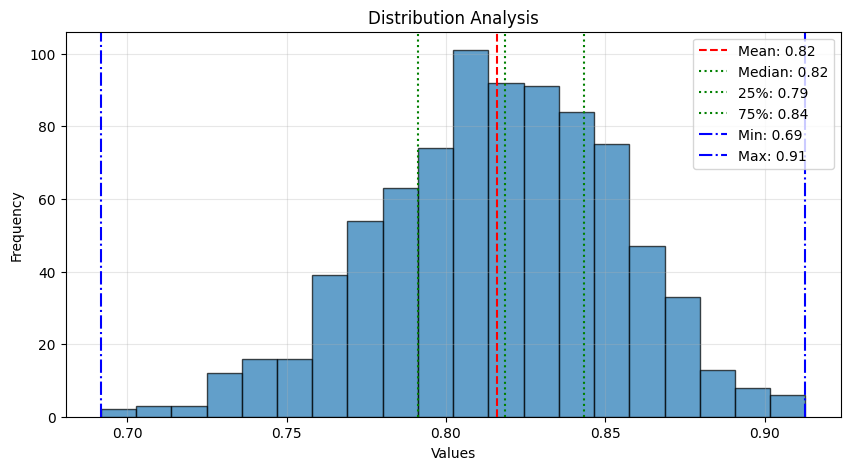

{'mean': 0.8159558266544571,
 'std': 0.03738301832315855,
 'min': 0.6917341351509094,
 '25%': 0.7912503629922867,
 'median': 0.8183881938457489,
 '75%': 0.8433952778577805,
 'max': 0.9127541780471802}

In [186]:
coco_confidence_scores_detailed = compute_confidence_scores_for_dataset('/kaggle/input/val-photos', prompt='<DETAILED_CAPTION>')
analyze_distribution(coco_confidence_scores_detailed)

Таким образом, мы установили, что средняя уверенность модели на не служебных токенах действительно довольно низка для изображений, на которых модель выдаёт нерелевантный ответ, особенно при более детальном описании изображения. На части датасета coco было установлено, что для реальных изображений данная метрика не опускается ниже 0.64 для prompt='CAPTION' и 0.69 для prompt='DETAILED_CAPTION'  
Но в случае краткого описания изображения метрика может не отражать неуверенность модели в сути, так как в сгенерированном описании могут преобладать служебные части речи, в которых модель уверена всегда

**На основании полученных фактов можно сделать следующие эвристики для учёта неуверенности модели при генерации ответа пользователю при mean_confidence < 0.64:**
1. Для prompt='CAPTION' выводить сообщение о низкой уверенности модели в ответе и высокой возможности ошибки
2. Для более детальных промптов выводить сообщение о неудаче в распознавании содержания изображения